In [1]:
#Importing all necessary Libraries 

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
import plotly.graph_objects as go
import warnings
import math
    
warnings.filterwarnings('ignore')
sns.set(rc={'figure.figsize':(12,6)})

In [2]:
###############################
#                             #
#                             #
#    ANALYSING WORLD DATA     #
#                             #
#                             #
###############################

In [3]:
worldConfirmed = pd.read_csv('time_series_covid_19_confirmed.csv');
worldConfirmed.info();

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264 entries, 0 to 263
Data columns (total 94 columns):
Province/State    82 non-null object
Country/Region    264 non-null object
Lat               264 non-null float64
Long              264 non-null float64
1/22/20           264 non-null int64
1/23/20           264 non-null int64
1/24/20           264 non-null int64
1/25/20           264 non-null int64
1/26/20           264 non-null int64
1/27/20           264 non-null int64
1/28/20           264 non-null int64
1/29/20           264 non-null int64
1/30/20           264 non-null int64
1/31/20           264 non-null int64
2/1/20            264 non-null int64
2/2/20            264 non-null int64
2/3/20            264 non-null int64
2/4/20            264 non-null int64
2/5/20            264 non-null int64
2/6/20            264 non-null int64
2/7/20            264 non-null int64
2/8/20            264 non-null int64
2/9/20            264 non-null int64
2/10/20           264 non-null int64
2/

In [4]:
worldConfirmed

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20
0,NaN,Afghanistan,33.000000,65.000000,0,0,0,0,0,0,...,555,607,665,714,784,840,906,933,996,1026
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,433,446,467,475,494,518,539,548,562,584
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,1825,1914,1983,2070,2160,2268,2418,2534,2629,2718
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,601,638,646,659,673,673,696,704,713,717
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,19,19,19,19,19,19,19,24,24,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,Saint Pierre and Miquelon,France,46.885200,-56.315900,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
260,NaN,South Sudan,6.877000,31.307000,0,0,0,0,0,0,...,4,4,4,4,4,4,4,4,4,4
261,NaN,Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,...,4,6,6,6,6,6,6,6,6,6
262,NaN,Sao Tome and Principe,0.186360,6.613081,0,0,0,0,0,0,...,4,4,4,4,4,4,4,4,4,4


In [5]:
worldConfirmed.isnull().sum()

Province/State    182
Country/Region      0
Lat                 0
Long                0
1/22/20             0
                 ... 
4/16/20             0
4/17/20             0
4/18/20             0
4/19/20             0
4/20/20             0
Length: 94, dtype: int64

In [6]:
worldSeparate = worldConfirmed.groupby('Country/Region').aggregate(sum)
worldSeparate

,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Afghanistan,33.000000,65.000000,0,0,0,0,0,0,0,0,...,555,607,665,714,784,840,906,933,996,1026
Albania,41.153300,20.168300,0,0,0,0,0,0,0,0,...,433,446,467,475,494,518,539,548,562,584
Algeria,28.033900,1.659600,0,0,0,0,0,0,0,0,...,1825,1914,1983,2070,2160,2268,2418,2534,2629,2718
Andorra,42.506300,1.521800,0,0,0,0,0,0,0,0,...,601,638,646,659,673,673,696,704,713,717
Angola,-11.202700,17.873900,0,0,0,0,0,0,0,0,...,19,19,19,19,19,19,19,24,24,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,0,0,...,268,290,308,308,374,374,402,418,437,449
Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,0,0,...,4,6,6,6,6,6,6,6,6,6
Yemen,15.552727,48.516388,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1


In [7]:
fig = go.Figure()
for i in worldSeparate.index:
    fig.add_trace(go.Scatter(x=worldSeparate.columns[2:], y=worldSeparate.ix[i,2:] ,
                    mode='lines+markers',
                    name=i))
else:
    fig.show()

In [8]:
###############################
#                             #
#                             #
#    ANALYSING INDIA DATA     #
#                             #
#                             #
###############################

In [9]:
data = pd.read_csv('covid_19_india.csv',index_col=0)
data.head()

,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
Sno,,,,,,,,
1,30/01/20,6:00 PM,Kerala,1,0,0,0,1
2,31/01/20,6:00 PM,Kerala,1,0,0,0,1
3,01/02/20,6:00 PM,Kerala,2,0,0,0,2
4,02/02/20,6:00 PM,Kerala,3,0,0,0,3
5,03/02/20,6:00 PM,Kerala,3,0,0,0,3


In [10]:
pd.unique(data['ConfirmedIndianNational'])

array(['1', '2', '3', '0', '6', '7', '8', '9', '4', '15', '5', '17', '10',
       '11', '19', '14', '22', '32', '12', '23', '24', '36', '25', '39',
       '44', '18', '16', '26', '49', '33', '60', '13', '28', '45', '64',
       '21', '29', '71', '30', '37', '87', '86', '41', '101', '125', '34',
       '35', '42', '55', '110', '20', '121', '40', '129', '127', '38',
       '168', '177', '52', '46', '54', '-'], dtype=object)

In [11]:
pd.unique(data['ConfirmedForeignNational'])

array(['0', '1', '2', '14', '3', '9', '7', '11', '10', '8', '6', '-'],
      dtype=object)

In [12]:
data = data.drop(['ConfirmedIndianNational','ConfirmedForeignNational'
                  ,'Time'],axis = 1)
data.tail()

,Date,State/UnionTerritory,Cured,Deaths,Confirmed
Sno,,,,,
1186,21/04/20,Telengana,190,23,919
1187,21/04/20,Tripura,1,0,2
1188,21/04/20,Uttarakhand,18,0,46
1189,21/04/20,Uttar Pradesh,140,20,1294
1190,21/04/20,West Bengal,73,12,392


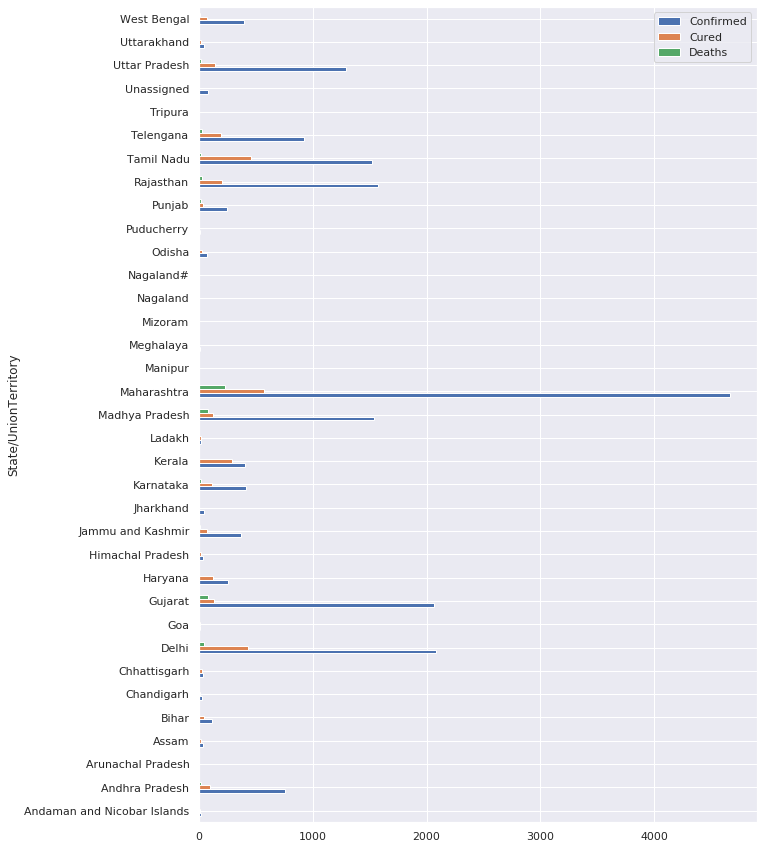

In [13]:
stateWise = data.groupby(['State/UnionTerritory'])[['Confirmed','Cured','Deaths']].aggregate(max)
stateWise[['Confirmed','Cured','Deaths']].plot(kind = 'barh',figsize=(10,15))


In [14]:
stateList = list((pd.unique(data['State/UnionTerritory'])))
stateList.remove("Unassigned")
stateList

['Kerala',
 'Telengana',
 'Delhi',
 'Rajasthan',
 'Uttar Pradesh',
 'Haryana',
 'Ladakh',
 'Tamil Nadu',
 'Karnataka',
 'Maharashtra',
 'Punjab',
 'Jammu and Kashmir',
 'Andhra Pradesh',
 'Uttarakhand',
 'Odisha',
 'Puducherry',
 'West Bengal',
 'Chhattisgarh',
 'Chandigarh',
 'Gujarat',
 'Himachal Pradesh',
 'Madhya Pradesh',
 'Bihar',
 'Manipur',
 'Mizoram',
 'Andaman and Nicobar Islands',
 'Goa',
 'Assam',
 'Jharkhand',
 'Arunachal Pradesh',
 'Tripura',
 'Nagaland',
 'Meghalaya',
 'Nagaland#']

In [15]:
stateData = data[
            (data['State/UnionTerritory'] == "Maharashtra")
        ]
stateData.head()#First 5 entries

,Date,State/UnionTerritory,Cured,Deaths,Confirmed
Sno,,,,,
77,09/03/20,Maharashtra,0,0,2
92,10/03/20,Maharashtra,0,0,5
98,11/03/20,Maharashtra,0,0,2
121,12/03/20,Maharashtra,0,0,11
134,13/03/20,Maharashtra,0,0,14


In [16]:
stateData.tail()#last 5 entries

,Date,State/UnionTerritory,Cured,Deaths,Confirmed
Sno,,,,,
1044,17/04/20,Maharashtra,300,194,3205
1077,18/04/20,Maharashtra,331,201,3323
1110,19/04/20,Maharashtra,365,211,3651
1143,20/04/20,Maharashtra,507,223,4203
1176,21/04/20,Maharashtra,572,232,4669


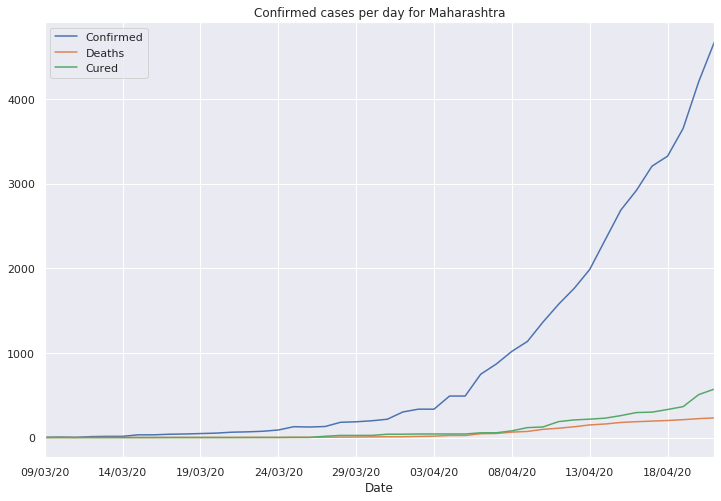

In [17]:
stateData[['Date','Confirmed','Deaths','Cured']].set_index('Date')\
.plot(kind = 'line',title = "Confirmed cases per day for "+"Maharashtra",
      figsize=(12,8));

In [18]:
perDayIncrement = []
for ind,val in enumerate(stateData['Confirmed']):
    if ind == 0 or ind == len(stateData['Confirmed'] - 1):
        perDayIncrement.append(val)
    else:
        incre = (val - stateData['Confirmed'].iloc[ind-1])
        perDayIncrement.append(incre)
else:
    stateData['perDayIncrement'] = perDayIncrement

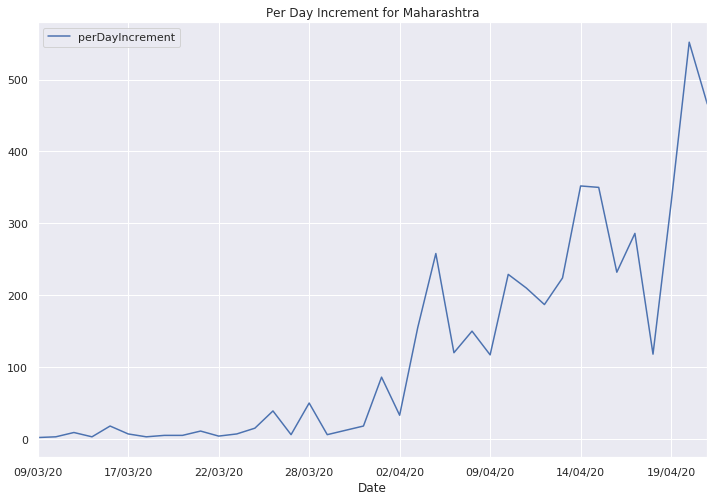

In [19]:
dfPerDay = stateData[['Date','Confirmed',"perDayIncrement"]]
dfPerDay = dfPerDay[
            (dfPerDay['perDayIncrement'] > 0)
        ]

dfPerDay[['Date','perDayIncrement']].set_index('Date')\
.plot(kind = 'line',title = "Per Day Increment for "+
      "Maharashtra",figsize=(12,8))
plt.show()

Text(0.5, 1.0, 'Box Plot for Maharashtra')

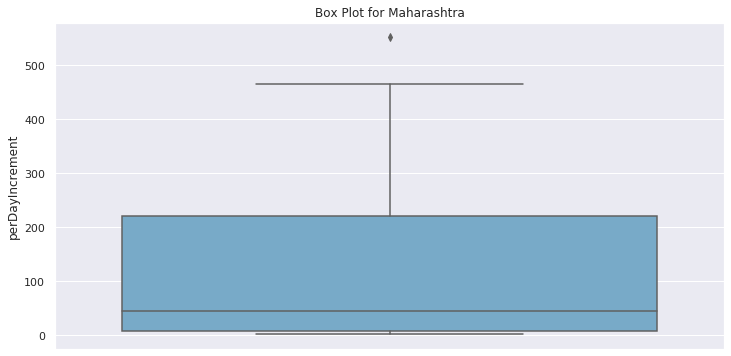

In [20]:
sns.boxplot(y = dfPerDay['perDayIncrement'] ,orient='v', 
            palette="Blues").set_title('Box Plot for '+"Maharashtra")

In [21]:
###############################
#                             #
#                             #
#   ANALYSING HOSPITAL DATA   #
#                             #
#                             #
###############################

In [22]:
hospitalData = pd.read_csv('HospitalBedsIndia.csv')
hospitalData = hospitalData.drop('Sno',axis = 1)
print(hospitalData.shape)
hospitalData.head()

(37, 11)


,State/UT,NumPrimaryHealthCenters_HMIS,NumCommunityHealthCenters_HMIS,NumSubDistrictHospitals_HMIS,NumDistrictHospitals_HMIS,TotalPublicHealthFacilities_HMIS,NumPublicBeds_HMIS,NumRuralHospitals_NHP18,NumRuralBeds_NHP18,NumUrbanHospitals_NHP18,NumUrbanBeds_NHP18
0,Andaman & Nicobar Islands,27,4,NaN,3,34,1246,27,575,3,500
1,Andhra Pradesh,1417,198,31.0,20,1666,60799,193,6480,65,16658
2,Arunachal Pradesh,122,62,NaN,15,199,2320,208,2136,10,268
3,Assam,1007,166,14.0,33,1220,19115,1176,10944,50,6198
4,Bihar,2007,63,33.0,43,2146,17796,930,6083,103,5936


In [23]:
hospitalData.describe()

,NumPrimaryHealthCenters_HMIS,NumCommunityHealthCenters_HMIS,NumSubDistrictHospitals_HMIS,NumDistrictHospitals_HMIS,TotalPublicHealthFacilities_HMIS,NumPublicBeds_HMIS,NumRuralHospitals_NHP18,NumRuralBeds_NHP18,NumUrbanHospitals_NHP18,NumUrbanBeds_NHP18
count,37.000000,37.000000,30.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000
mean,1616.162162,300.972973,83.666667,54.216216,2039.189189,39947.243243,1070.810811,15112.864865,203.891892,23306.648649
std,4861.772656,907.160512,229.572817,163.173584,6130.345694,120196.898697,3278.430865,45752.664986,616.352568,70502.578529
min,4.000000,2.000000,1.000000,1.000000,8.000000,250.000000,0.000000,0.000000,0.000000,0.000000
25%,87.000000,17.000000,6.000000,9.000000,114.000000,2666.000000,24.000000,630.000000,14.000000,1393.000000
50%,521.000000,82.000000,25.500000,23.000000,683.000000,13527.000000,273.000000,5805.000000,59.000000,5228.000000
75%,1417.000000,229.000000,63.250000,37.000000,1867.000000,39511.000000,705.000000,10944.000000,149.000000,18819.000000
max,29899.000000,5568.000000,1255.000000,1003.000000,37725.000000,739024.000000,19810.000000,279588.000000,3772.000000,431173.000000


In [24]:
hospitalData.isnull().any(1).nonzero()

(array([ 0,  2,  8, 14, 22, 24, 33]),)

In [25]:
hospitalData = hospitalData.fillna(-1)
hospitalData.head()

,State/UT,NumPrimaryHealthCenters_HMIS,NumCommunityHealthCenters_HMIS,NumSubDistrictHospitals_HMIS,NumDistrictHospitals_HMIS,TotalPublicHealthFacilities_HMIS,NumPublicBeds_HMIS,NumRuralHospitals_NHP18,NumRuralBeds_NHP18,NumUrbanHospitals_NHP18,NumUrbanBeds_NHP18
0,Andaman & Nicobar Islands,27,4,-1.0,3,34,1246,27,575,3,500
1,Andhra Pradesh,1417,198,31.0,20,1666,60799,193,6480,65,16658
2,Arunachal Pradesh,122,62,-1.0,15,199,2320,208,2136,10,268
3,Assam,1007,166,14.0,33,1220,19115,1176,10944,50,6198
4,Bihar,2007,63,33.0,43,2146,17796,930,6083,103,5936


In [26]:
#Individual Hospital Counts in Different States

states = list(hospitalData['State/UT'])

for ind in range(0,len(states)):
    labels = hospitalData.columns.values
    values = hospitalData.iloc[ind,:].values

    # Use `hole` to create a donut-like pie chart
    fig = go.Figure(data=[go.Pie(labels=labels, values=values,title=hospitalData.iloc[ind,0], hole=.4)])
    fig.show()

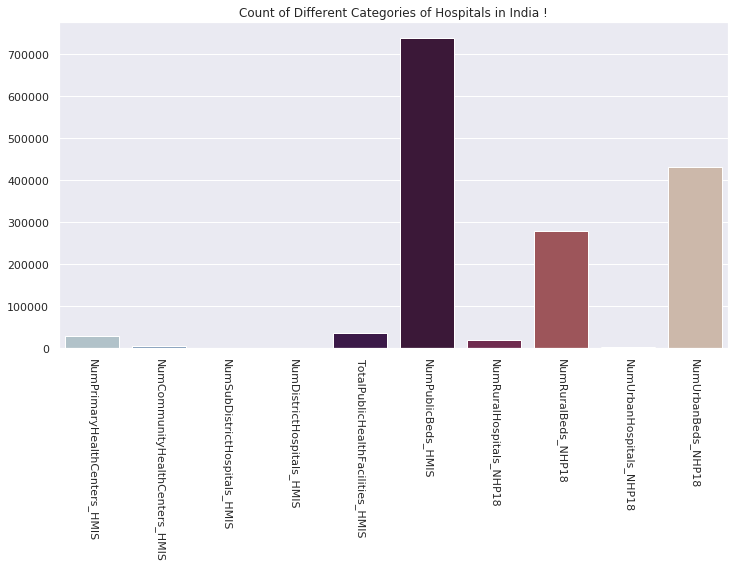

In [27]:
#Different Hospital Counts in India 

cols = list(hospitalData.columns)
cols.remove('State/UT')
SumData = hospitalData[cols].iloc[:-1,:].sum(axis=0,skipna=True)
bplot = sns.barplot(x = SumData.index,y = SumData,palette="twilight" );
bplot.set_xticklabels(rotation=-90,labels= SumData.index);
bplot.set_title("Count of Different Categories of Hospitals in India !");

In [28]:
###############################
#                             #
#                             #
#     ANALYSING LABS DATA     #
#                             #
#                             #
###############################

In [29]:
labData = pd.read_csv('ICMRTestingLabs.csv')
labData.head()

,lab,address,pincode,city,state,type
0,"ICMR-Regional Medical Research Centre, Port Blair","ICMR-Regional Medical Research Centre, Post Ba...",744103,Port Blair,Andaman and Nicobar Islands,Government Laboratory
1,Tomo Riba Institute of Health & Medical Scienc...,"National Highway 52A, Old Assembly Complex, Na...",791110,Naharlagun,Arunachal Pradesh,Collection Site
2,Sri Venkateswara Institute of Medical Sciences...,Sri Venkateswara Institute of Medical Sciences...,517507,Tirupati,Andhra Pradesh,Government Laboratory
3,"Rangaraya Medical College, Kakinada","Rangaraya Medical College, Kakinada Pithampura...",533001,Kakinada,Andhra Pradesh,Government Laboratory
4,"Sidhartha Medical College, Vijaywada","Siddhartha Medical College, Vijayawada NH 16 S...",520008,Vijayawada,Andhra Pradesh,Government Laboratory


In [30]:
pd.unique(labData.type)

array(['Government Laboratory', 'Collection Site', 'Private Laboratory'],
      dtype=object)

In [31]:
stateLabs = labData.groupby('state')[['lab']].aggregate('count')
stateLabs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34 entries, Andaman and Nicobar Islands to West Bengal
Data columns (total 1 columns):
lab    34 non-null int64
dtypes: int64(1)
memory usage: 544.0+ bytes


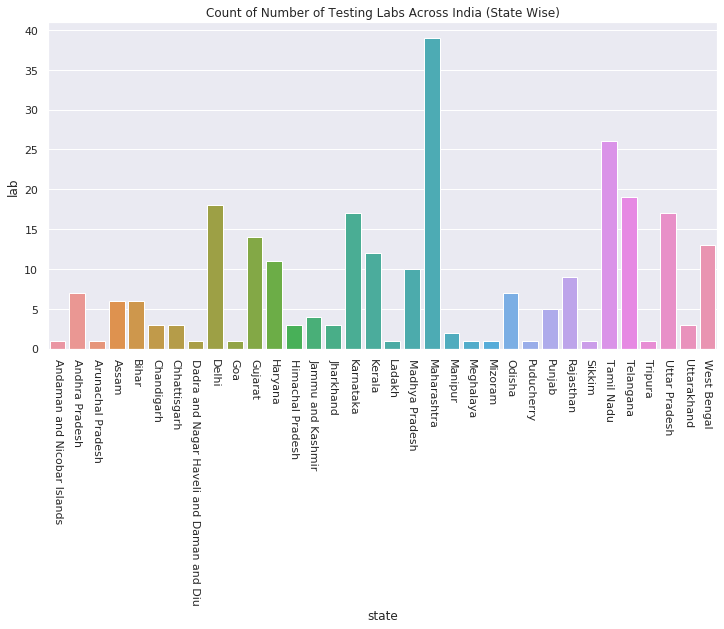

In [32]:
labChart = sns.barplot(x = stateLabs.index,y = stateLabs.lab)
labChart.set_xticklabels(rotation = -90, labels = stateLabs.index)
labChart.set_title("Count of Number of Testing Labs Across India (State Wise)");
plt.show()

In [33]:
stateLabCategory = labData.groupby('type')[['lab']].aggregate('count')
stateLabCategory.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3 entries, Collection Site to Private Laboratory
Data columns (total 1 columns):
lab    3 non-null int64
dtypes: int64(1)
memory usage: 48.0+ bytes


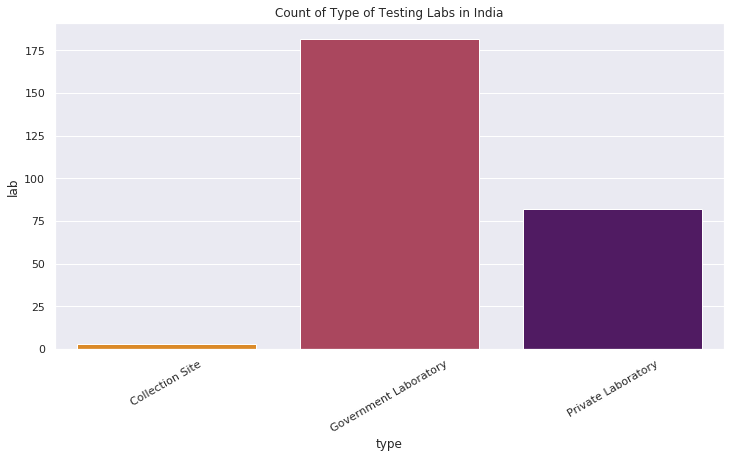

In [34]:
labCategory = sns.barplot(x = stateLabCategory.index,y = stateLabCategory.lab,palette='inferno_r')
labCategory.set_xticklabels(rotation=30,labels = stateLabCategory.index)
labCategory.set_title("Count of Type of Testing Labs in India");
plt.show()

In [35]:
###############################
#                             #
#                             #
#   ANALYSING LAB TEST DATA   #
#                             #
#                             #
###############################

In [36]:
testingDetails = pd.read_csv('ICMRTestingDetails.csv')

In [37]:
testingDetails.describe()

,SNo,TotalSamplesTested,TotalIndividualsTested,TotalPositiveCases
count,36.000000,32.000000,21.000000,29.000000
mean,18.500000,132501.718750,154825.238095,5196.896552
std,10.535654,130431.487486,144229.479812,5290.636394
min,1.000000,6500.000000,5900.000000,78.000000
25%,9.750000,24531.500000,17237.000000,536.000000
50%,18.500000,84742.000000,147034.000000,3554.000000
75%,27.250000,201199.500000,258730.000000,8312.000000
max,36.000000,462621.000000,447812.000000,17615.000000


In [38]:
testingDetails.tail()

,SNo,DateTime,TotalSamplesTested,TotalIndividualsTested,TotalPositiveCases
31,32,17/04/20 21:00,335123.0,318449.0,14098.0
32,33,18/04/20 21:00,372123.0,354969.0,16365.0
33,34,19/04/20 21:00,401586.0,383985.0,17615.0
34,35,20/04/20 21:00,NaN,NaN,NaN
35,36,21/04/20 21:00,462621.0,447812.0,NaN


In [39]:
testingDetails.dropna(axis=0,inplace=True)
testingDetails

,SNo,DateTime,TotalSamplesTested,TotalIndividualsTested,TotalPositiveCases
0,1,13/03/20 18:00,6500.0,5900.0,78.0
1,2,18/03/20 18:00,13125.0,12235.0,150.0
2,3,19/03/20 18:00,14175.0,13285.0,182.0
3,4,20/03/20 18:00,15404.0,14514.0,236.0
4,5,21/03/20 18:00,16911.0,16021.0,315.0
5,6,22/03/20 18:00,18127.0,17237.0,396.0
6,7,23/03/20 20:00,20707.0,19817.0,471.0
7,8,24/03/20 20:00,22694.0,21804.0,536.0
8,9,25/03/20 20:00,25144.0,24254.0,581.0
23,24,09/04/20 21:00,144910.0,130792.0,5705.0


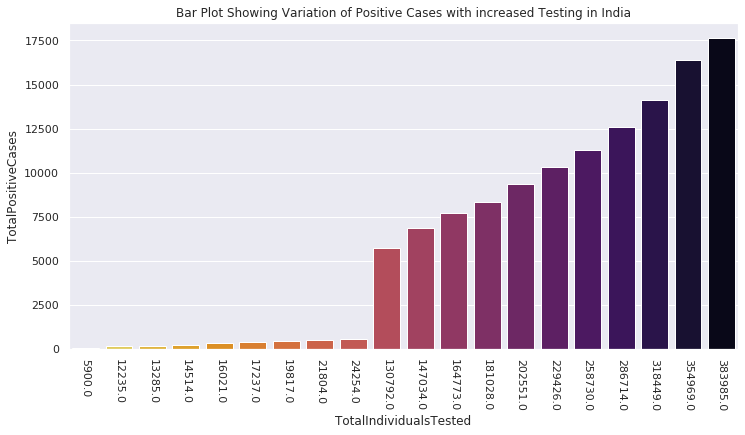

In [40]:
inc = sns.barplot(x =testingDetails['TotalIndividualsTested'],y=testingDetails['TotalPositiveCases'],palette="inferno_r")
inc.set_title("Bar Plot Showing Variation of Positive Cases with increased Testing in India");
inc.set_xticklabels(labels = testingDetails['TotalIndividualsTested'],rotation = -90);

In [41]:
###############################
#                             #
#                             #
#  ANALYSING STATE WISE DATA  #
#                             #
#                             #
###############################

In [42]:
stateTests = pd.read_csv('StatewiseTestingDetails.csv')
stateTests.columns

Index(['Date', 'State', 'TotalSamples', 'Negative', 'Positive'], dtype='object')

In [43]:
stateTests.describe()

,TotalSamples,Negative,Positive
count,201.000000,198.000000,201.000000
mean,3960.955224,3518.702020,171.805970
std,5183.873400,4873.665925,245.123861
min,49.000000,49.000000,0.000000
25%,731.000000,608.250000,9.000000
50%,2297.000000,1851.000000,72.000000
75%,5015.000000,4071.500000,234.000000
max,31841.000000,30477.000000,1364.000000


In [44]:
stateTests.isnull().sum()

Date            0
State           0
TotalSamples    0
Negative        3
Positive        0
dtype: int64

In [45]:
stateTests.dropna(axis=0,inplace=True)
stateTests.isnull().sum()

Date            0
State           0
TotalSamples    0
Negative        0
Positive        0
dtype: int64

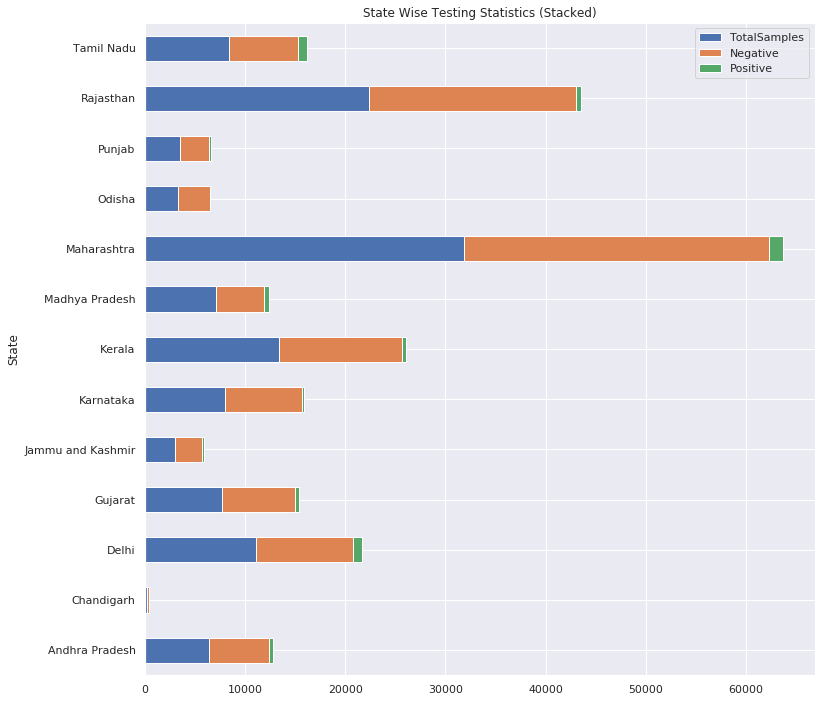

In [46]:
stateTests.groupby('State')[['TotalSamples','Negative','Positive']].aggregate(max)\
.plot(kind='barh',stacked=True,title="State Wise Testing Statistics (Stacked)",figsize=(12,12))

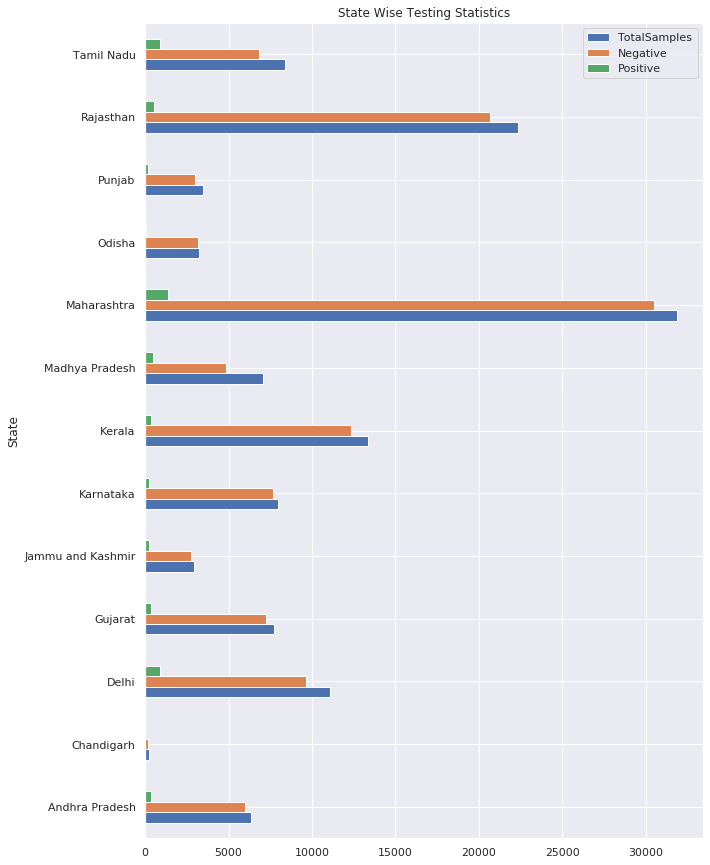

In [47]:
stateTests.groupby('State')[['TotalSamples','Negative','Positive']].aggregate(max)\
.plot(kind='barh',title="State Wise Testing Statistics",figsize=(10,15))

In [48]:
stateData[['Confirmed']].describe()

,Confirmed
count,44.000000
mean,935.136364
std,1301.883387
min,2.000000
25%,50.750000
50%,207.000000
75%,1416.500000
max,4669.000000


In [49]:
#Without any skew function
dfPerDay = stateData[['Date','Confirmed',"perDayIncrement"]]
dfPerDay = dfPerDay[
            (dfPerDay['perDayIncrement'] > 0)
        ]


fig = go.Figure()
dfPerDay['Date'] = pd.to_datetime(dfPerDay['Date'],dayfirst=True)
dfPerDay['Date'] = dfPerDay['Date'].map(dt.datetime.toordinal)


x = dfPerDay['Date'].values
x = x.reshape(-1,1)
y = dfPerDay['perDayIncrement'].values
 
rfmodel = LinearRegression(fit_intercept=True)
        
rfmodel.fit(x,y)
y_predition = rfmodel.predict(x)

fig.add_trace(go.Scatter(x = dfPerDay['Date'] , y= dfPerDay['perDayIncrement'],
                    mode='markers', name='Actual Points'))

fig.add_trace(go.Scatter(x=dfPerDay['Date'], y=y_predition,
                    mode='lines+markers',
                    name='Regression Fit'))
mse = mean_squared_error(y,y_predition)
print("Mean Squared Error : "+str(mse))
fig.show()

Mean Squared Error : 6142.170884486193


In [50]:
#CUBE ROOT FOR SKEW DATA

dfPerDay = stateData[['Date','Confirmed',"perDayIncrement"]]
dfPerDay = dfPerDay[
            (dfPerDay['perDayIncrement'] > 0)
        ]


fig = go.Figure()
dfPerDay['Date'] = pd.to_datetime(dfPerDay['Date'],dayfirst=True)
dfPerDay['Date'] = dfPerDay['Date'].map(dt.datetime.toordinal)
dfPerDay['perDayIncrement'] = dfPerDay['perDayIncrement'].apply(lambda x: (x**(1/3)).real )

x = dfPerDay['Date'].values
x = x.reshape(-1,1)
y = dfPerDay['perDayIncrement'].values
 
rfmodel = LinearRegression(fit_intercept=True)
        
rfmodel.fit(x,y)
y_predition = rfmodel.predict(x)

fig.add_trace(go.Scatter(x = dfPerDay['Date'] , y= dfPerDay['perDayIncrement'],
                    mode='markers', name='Actual Points'))

fig.add_trace(go.Scatter(x=dfPerDay['Date'], y=y_predition,
                    mode='lines+markers',
                    name='Regression Fit'))
mse = mean_squared_error(y,y_predition)
print("Mean Squared Error : "+str(mse))
fig.show()

Mean Squared Error : 0.7142247074013214


In [51]:
#LOG FOR SKEW DATA

dfPerDay = stateData[['Date','Confirmed',"perDayIncrement"]]
dfPerDay = dfPerDay[
            (dfPerDay['perDayIncrement'] > 0)
        ]


fig = go.Figure()
dfPerDay['Date'] = pd.to_datetime(dfPerDay['Date'],dayfirst=True)
dfPerDay['Date'] = dfPerDay['Date'].map(dt.datetime.toordinal)
dfPerDay['perDayIncrement'] = np.log(dfPerDay['perDayIncrement'])

x = dfPerDay['Date'].values
x = x.reshape(-1,1)
y = dfPerDay['perDayIncrement'].values
 
rfmodel = LinearRegression(fit_intercept=True)
        
rfmodel.fit(x,y)
y_predition = rfmodel.predict(x)

fig.add_trace(go.Scatter(x = dfPerDay['Date'] , y= dfPerDay['perDayIncrement'],
                    mode='markers', name='Actual Points'))

fig.add_trace(go.Scatter(x=dfPerDay['Date'], y=y_predition,
                    mode='lines+markers',
                    name='Regression Fit'))
mse = mean_squared_error(y,y_predition)
print("Mean Squared Error : "+str(mse))
fig.show()

Mean Squared Error : 0.4695729145468802


In [52]:
#WITHOUT ANY SKEW FUNCTION AS WELL AS PREDICTION ON CONFIRMED DATA PER DAY
dfPerDay = stateData[['Date','Confirmed',"perDayIncrement"]]
dfPerDay = dfPerDay[
            (dfPerDay['perDayIncrement'] > 0)
        ]


fig = go.Figure()
dfPerDay['Date'] = pd.to_datetime(dfPerDay['Date'],dayfirst=True)
dfPerDay['Date'] = dfPerDay['Date'].map(dt.datetime.toordinal)
dfPerDay['Confirmed'] = np.log(dfPerDay['Confirmed'])

x = dfPerDay['Date'].values
x = x.reshape(-1,1)
y = dfPerDay['Confirmed'].values
 
rfmodel = LinearRegression(fit_intercept=True)
        
rfmodel.fit(x,y)
y_predition = rfmodel.predict(x)

fig.add_trace(go.Scatter(x = dfPerDay['Date'] , y= dfPerDay['Confirmed'],
                    mode='markers', name='Actual Points'))

fig.add_trace(go.Scatter(x=dfPerDay['Date'], y=y_predition,
                    mode='lines+markers',
                    name='Regression Fit'))
mse = mean_squared_error(y,y_predition)
print("Mean Squared Error : "+str(mse))
fig.show()

Mean Squared Error : 0.09032235813952262


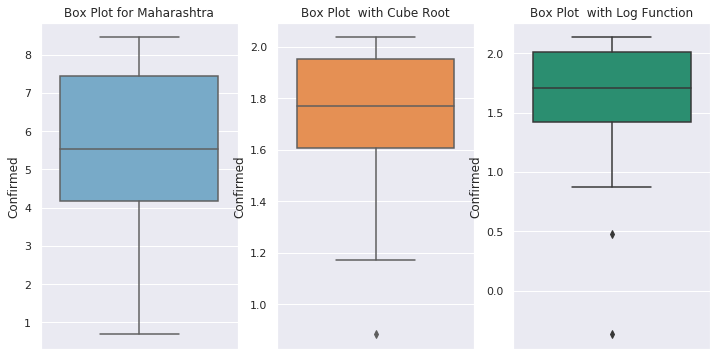

In [53]:
f, axes = plt.subplots(1, 3)

sns.boxplot(y = dfPerDay['Confirmed'] ,orient='v' , ax=axes[0],  
                    palette="Blues").set_title('Box Plot for Maharashtra');

sns.boxplot(y = dfPerDay['Confirmed'].apply(lambda x: (x**(1/3)).real ) , orient='v' , ax=axes[1],  
            palette="Oranges").set_title('Box Plot '+' with Cube Root');

sns.boxplot(y = np.log(dfPerDay['Confirmed']) , orient='v' , ax=axes[2],  
            palette="Dark2").set_title('Box Plot  with Log Function');

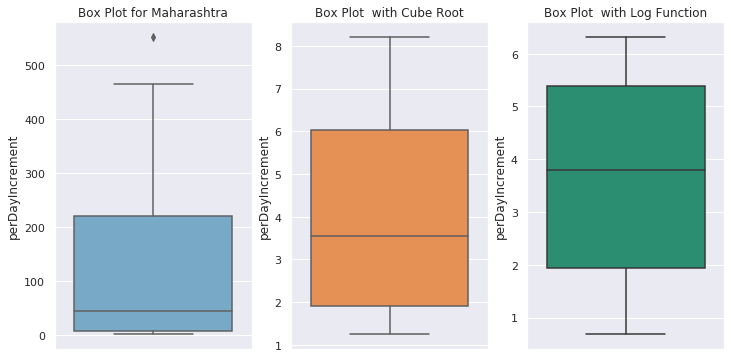

In [54]:
f, axes = plt.subplots(1, 3)

sns.boxplot(y = dfPerDay['perDayIncrement'] ,orient='v' , ax=axes[0],  
                    palette="Blues").set_title('Box Plot for Maharashtra');

sns.boxplot(y = dfPerDay['perDayIncrement'].apply(lambda x: (x**(1/3)).real ) , orient='v' , ax=axes[1],  
            palette="Oranges").set_title('Box Plot '+' with Cube Root');

sns.boxplot(y = np.log(dfPerDay['perDayIncrement']) , orient='v' , ax=axes[2],  
            palette="Dark2").set_title('Box Plot  with Log Function');

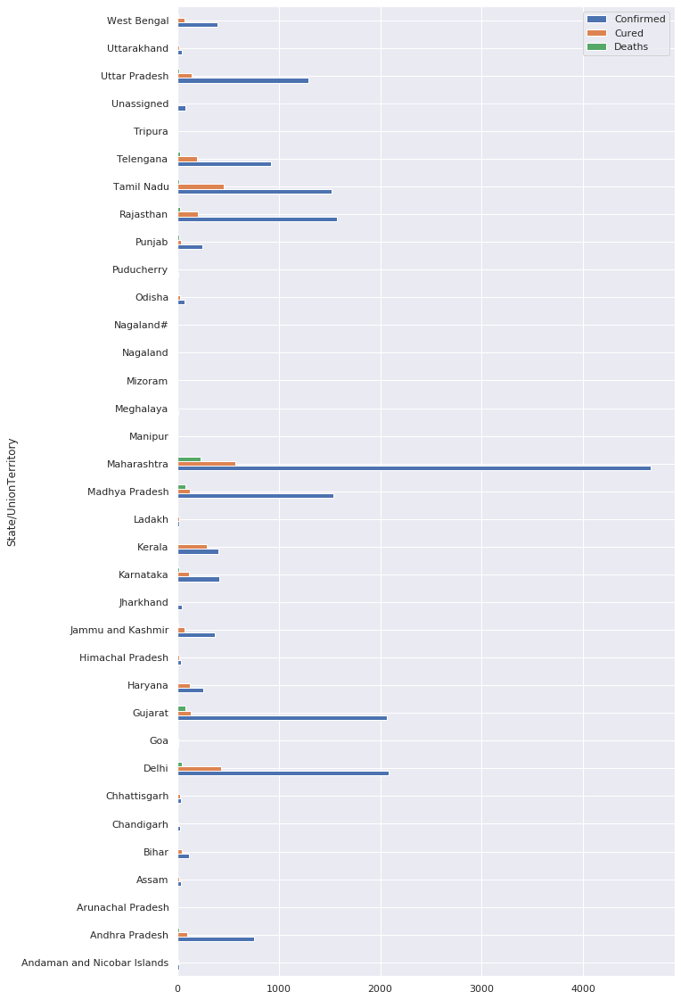

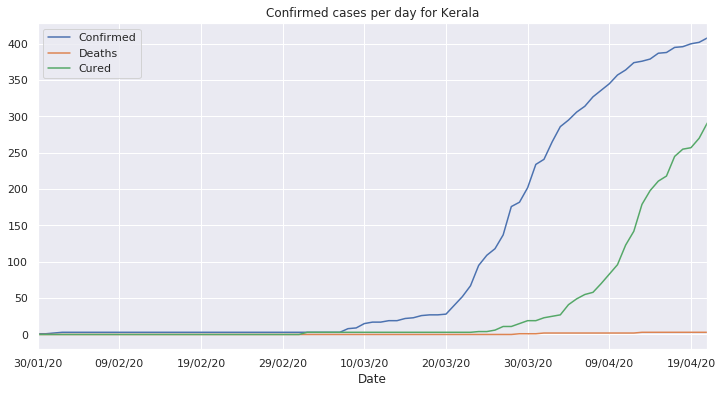

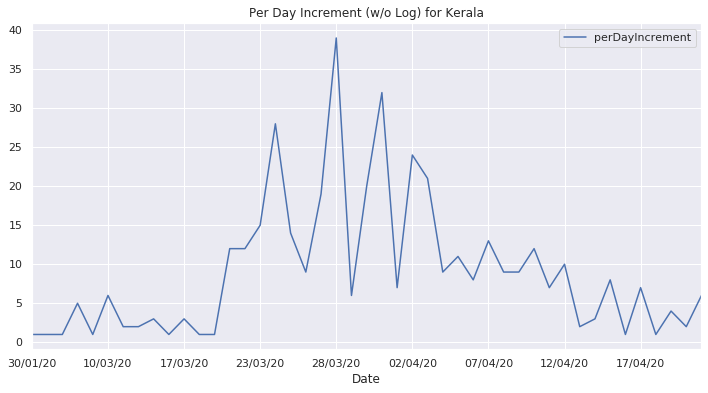

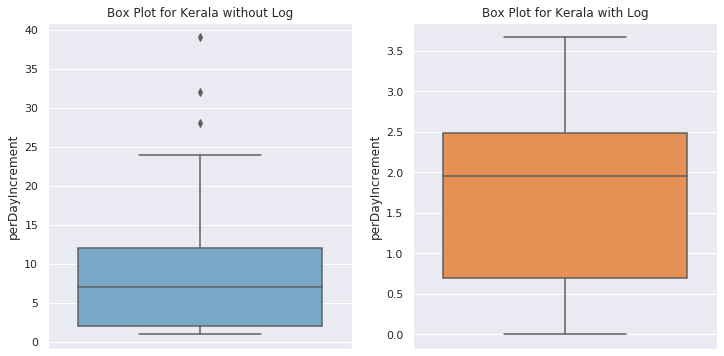

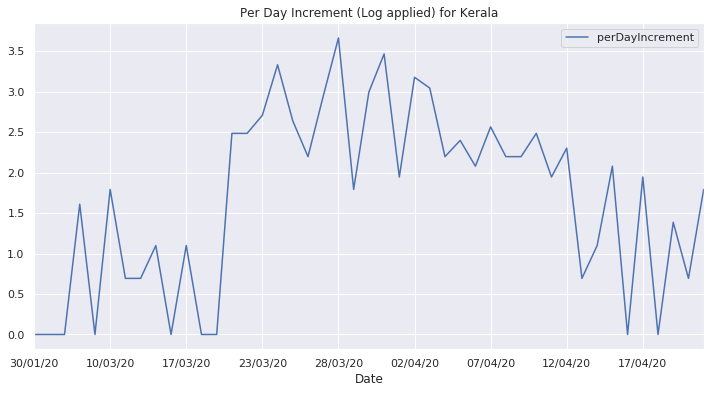

...

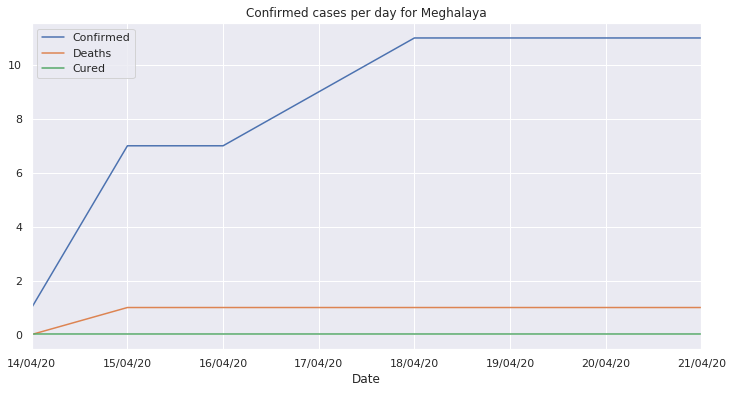

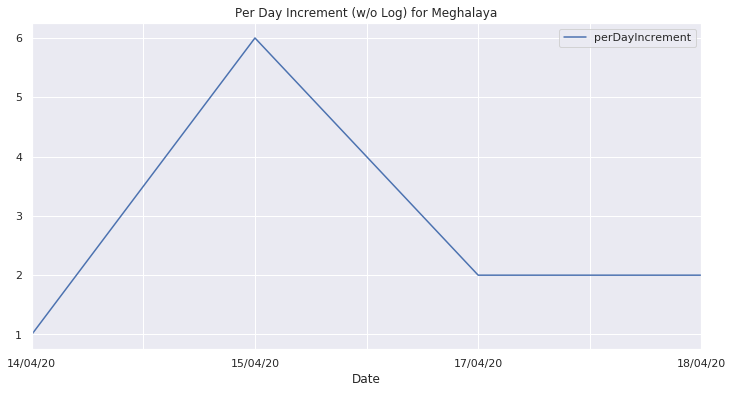

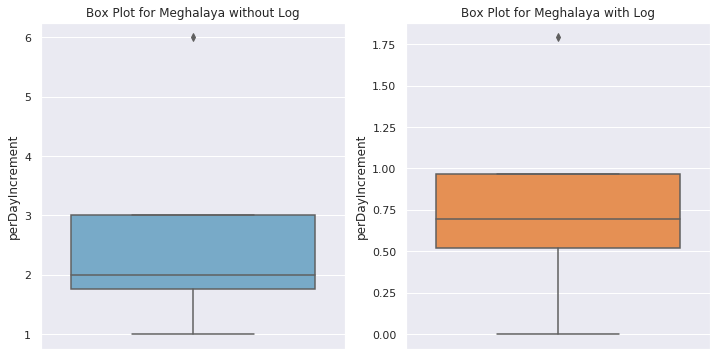

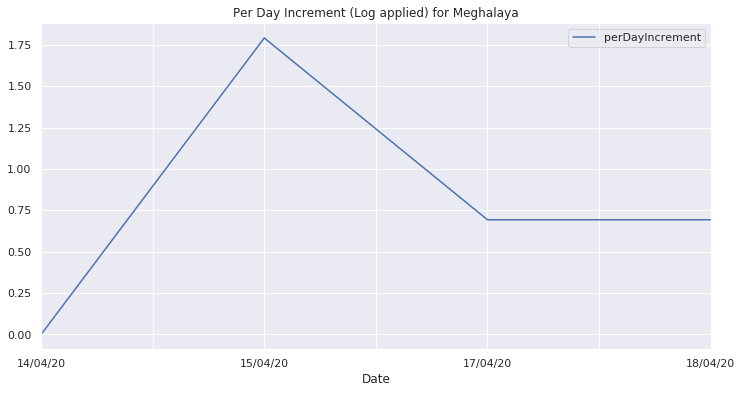

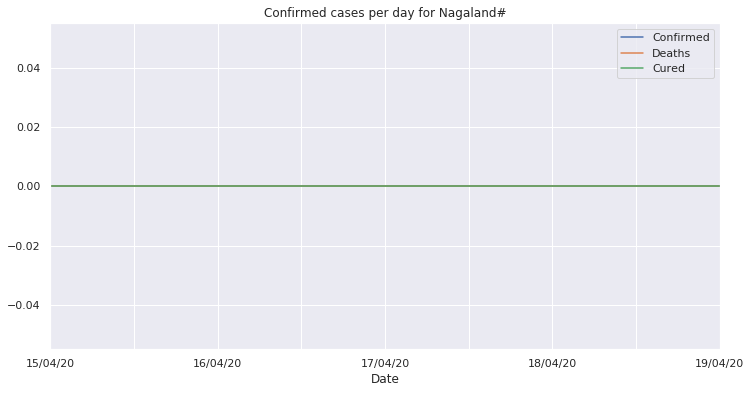

|--------------------------------|----------------------|----------------------|
|             State              |         Date         |   Confirmed Cases    |
|--------------------------------|----------------------|----------------------|
|             Kerala             | 2020-04-23 00:00:00  |         417          |
|--------------------------------|----------------------|----------------------|
|           Telengana            | 2020-04-23 00:00:00  |         1011         |
|--------------------------------|----------------------|----------------------|
|             Delhi              | 2020-04-23 00:00:00  |         2354         |
|--------------------------------|----------------------|----------------------|
|           Rajasthan            | 2020-04-23 00:00:00  |         1711         |
|--------------------------------|----------------------|----------------------|
|         Uttar Pradesh          | 2020-04-23 00:00:00  |         1406         |
|---------------------------

In [55]:
data = pd.read_csv('covid_19_india.csv',index_col=0)
data = data.drop(['ConfirmedIndianNational','ConfirmedForeignNational','Time'],axis = 1)
stateWise = data.groupby(['State/UnionTerritory'])[['Confirmed','Cured','Deaths']].aggregate(max)
stateWise[['Confirmed','Cured','Deaths']].plot(kind = 'barh',figsize=(10,20))


stateList = list((pd.unique(data['State/UnionTerritory'])))
stateList.remove("Unassigned")
stateAll = go.Figure()

errorList = []
statistics = []

def printData(statList):
    print("|-{:^30}-|-{:^20}-|-{:^20}-|".format("-"*30,"-"*20,"-"*20))
    print("| {:^30} | {:^20} | {:^20} |".format("State","Date","Confirmed Cases"))
    print("|-{:^30}-|-{:^20}-|-{:^20}-|".format("-"*30,"-"*20,"-"*20))
    
    for val in statList:    
        print("| {:^30} | {:^20} | {:^20} |".format(val[0],val[1],val[2]))
        print("|-{:^30}-|-{:^20}-|-{:^20}-|".format("-"*30,"-"*20,"-"*20))
        

for state in stateList:
    

    try:
        stateData = data[
            (data['State/UnionTerritory'] == state)
        ]

    
    
        stateData[['Date','Confirmed','Deaths','Cured']].set_index('Date').plot(kind = 'line',title = "Confirmed cases per day for "+state,figsize=(12,6))
        plt.show()
        
        perDayIncrement = []
        for ind,val in enumerate(stateData['Confirmed']):
            if ind == 0 or ind == len(stateData['Confirmed'] - 1):
                perDayIncrement.append(val)
            else:
                incre = (val - stateData['Confirmed'].iloc[ind-1])
                perDayIncrement.append(incre)
        else:
            stateData['perDayIncrement'] = perDayIncrement
    


        dfPerDay = stateData[['Date','Confirmed',"perDayIncrement"]]
    
        dfPerDay = dfPerDay[
            (dfPerDay['perDayIncrement'] > 0)
        ]

        dfPerDay[['Date','perDayIncrement']].set_index('Date').plot(kind = 'line',title = "Per Day Increment (w/o Log) for "+state,figsize=(12,6))
        plt.show()

        stateAll.add_trace(go.Scatter(x=dfPerDay['Date'], y=dfPerDay['perDayIncrement'] ,
                    mode='lines+markers',
                    name=state))
        f, axes = plt.subplots(1, 2)
        
        sns.boxplot(y = dfPerDay['perDayIncrement'] ,orient='v' , ax=axes[0],   palette="Blues").set_title('Box Plot for '+state+' without Log')
        
        
        
        dfPerDay['perDayIncrement'] = np.log(dfPerDay['perDayIncrement'])
    
        sns.boxplot(y = dfPerDay['perDayIncrement'] , orient='v' , ax=axes[1],  palette="Oranges").set_title('Box Plot for '+state+' with Log')
        plt.show()
        
        dfPerDay[['Date',('perDayIncrement')]].set_index('Date').plot(kind = 'line',title = "Per Day Increment (Log applied) for "+state,figsize=(12,6))
        plt.show()
    
    
    
    
        dfPerDay['Date'] = pd.to_datetime(dfPerDay['Date'],dayfirst=True)
        dfPerDay['Date'] = dfPerDay['Date'].map(dt.datetime.toordinal)
        dfPerDay.describe()

        x = dfPerDay['Date'].values
        x = x.reshape(-1,1)
        y = dfPerDay['perDayIncrement'].values

 
        x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.1,random_state = 10)
        rfmodel = LinearRegression(fit_intercept=True)

        
        rfmodel.fit(x_train,y_train)
        y_predition = rfmodel.predict(x_test)

        mse = mean_squared_error(y_test,y_predition)
        rmse = np.sqrt(mse)

        date = dt.datetime.now()
        date = pd.to_datetime(date,dayfirst=True)
        date = dt.datetime.toordinal(date)

        x = np.array([date])
        x = x.reshape(-1,1)

        confirmedPrediction = math.ceil(float(dfPerDay['Confirmed'].iloc[-1] + np.exp(rfmodel.predict(x)) ) )
        score = rfmodel.score(x_test,y_test)
        statistics.append((state,str(dt.datetime.fromordinal(date)),confirmedPrediction))
    except ValueError:
        continue
    except TypeError:
        continue
    
    except:
        raise
else:
    stateAll.show()
    printData(statistics)


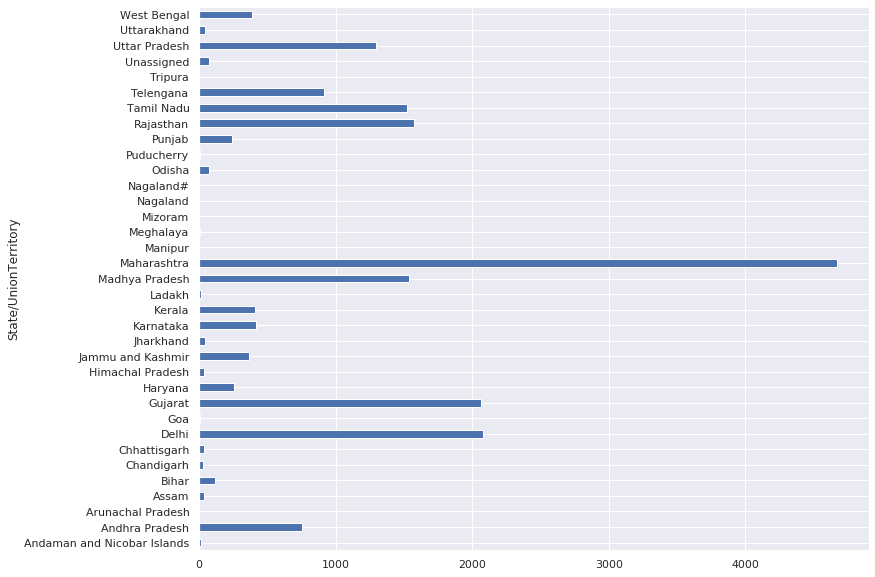

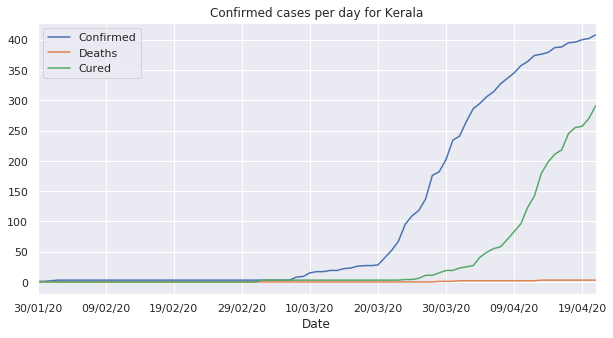

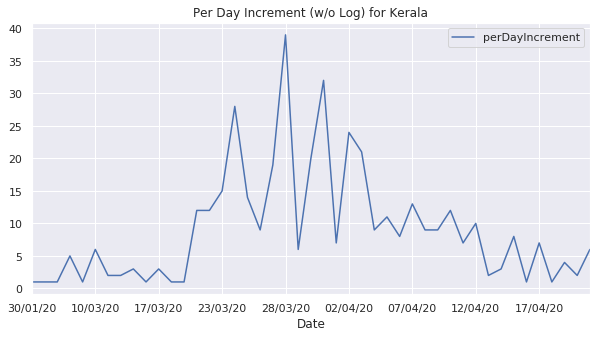

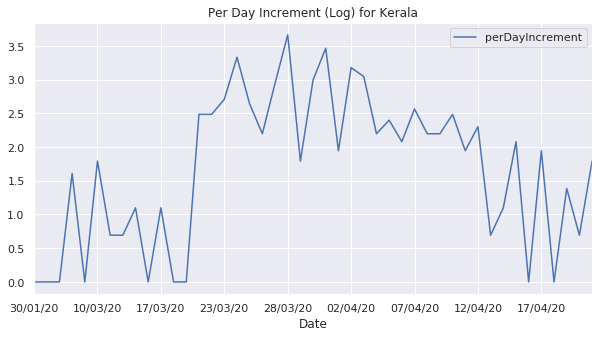

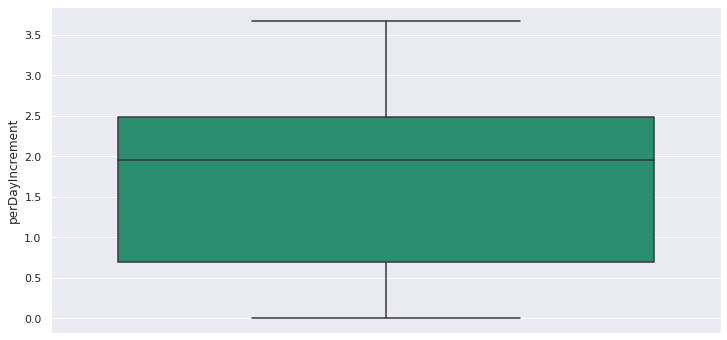

...

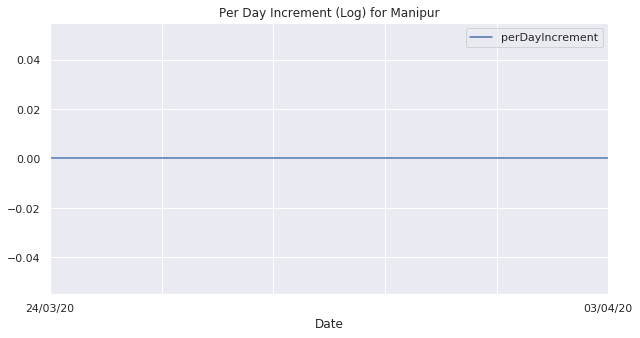

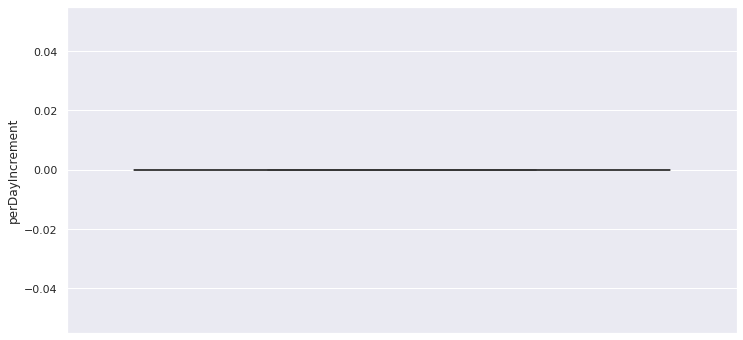

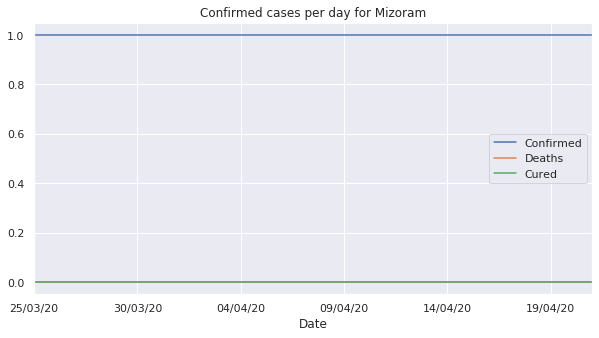

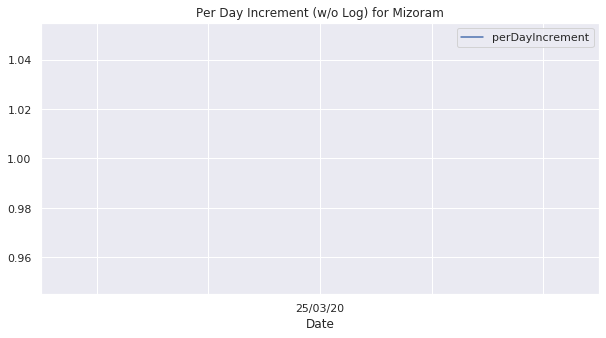

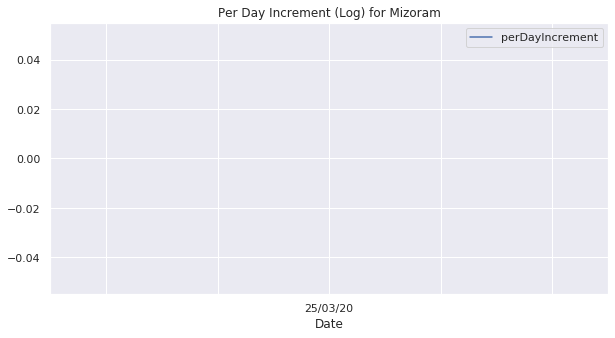

Mizoram


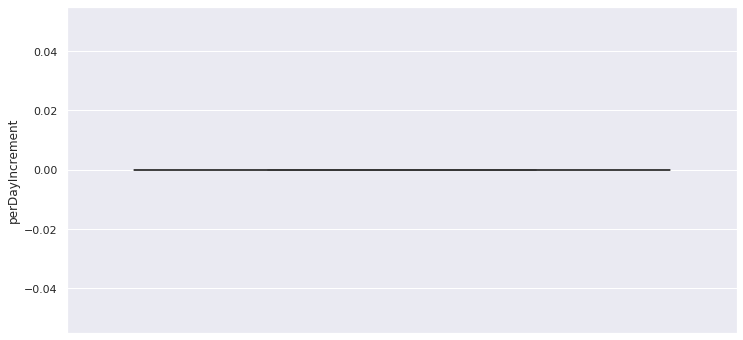

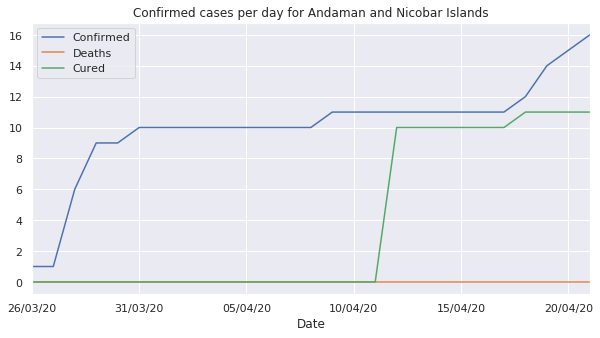

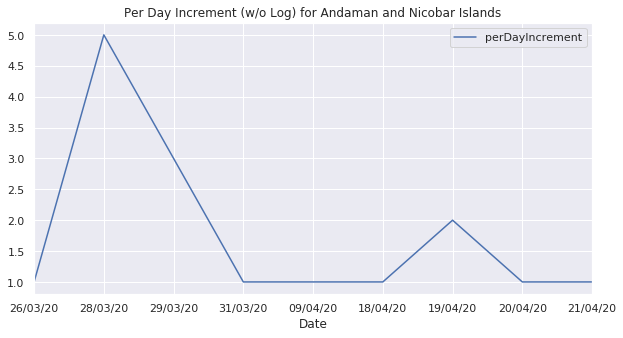

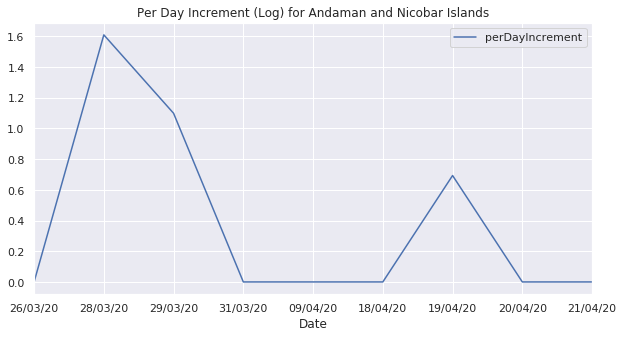

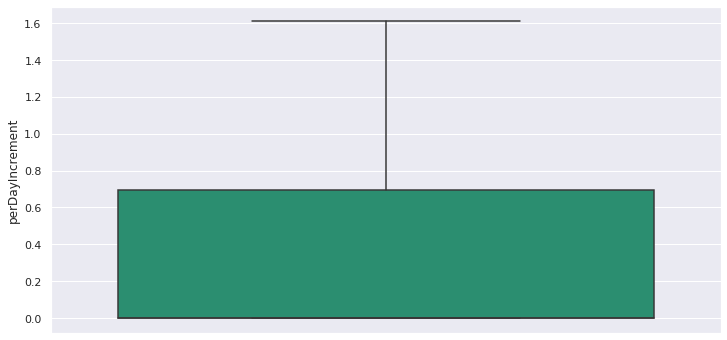

...

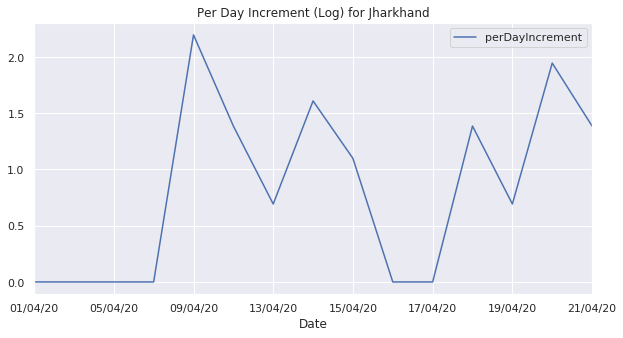

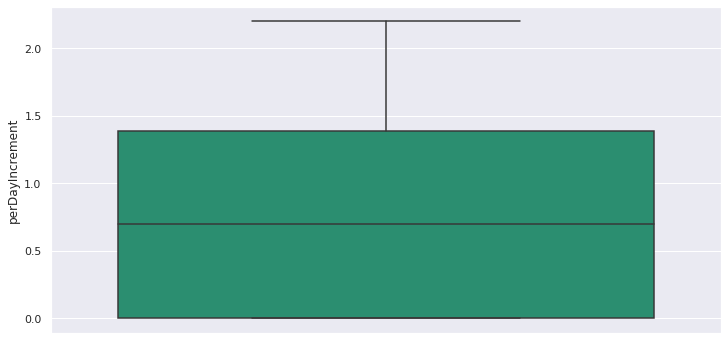

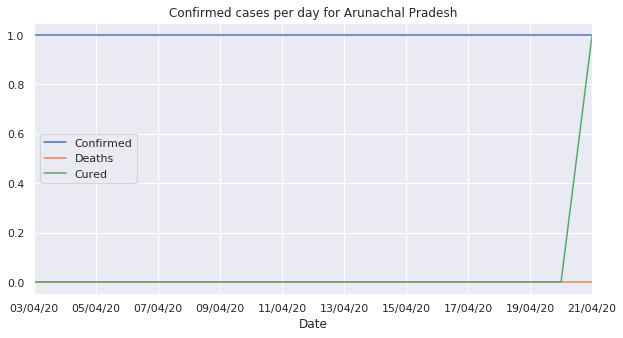

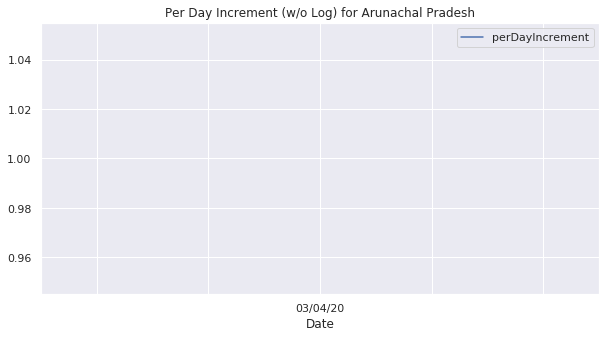

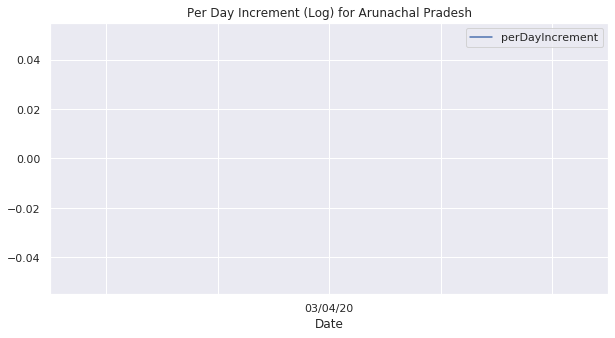

Arunachal Pradesh


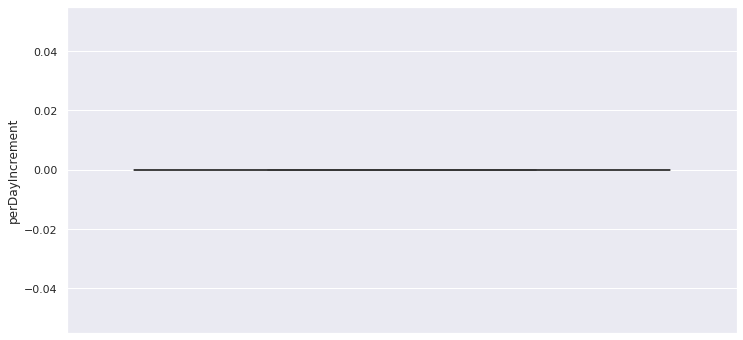

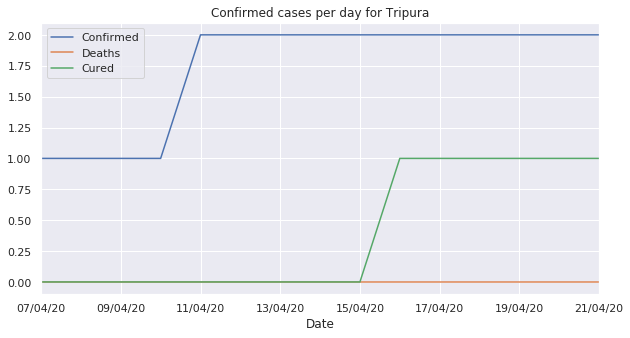

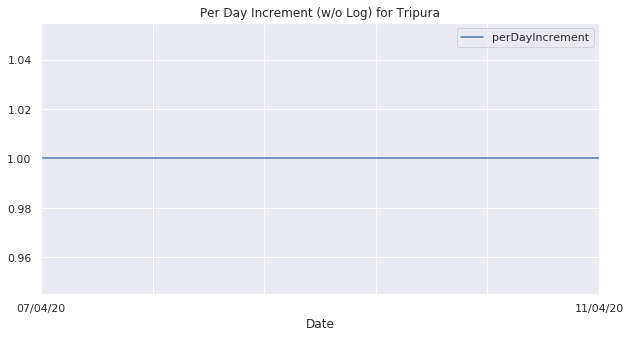

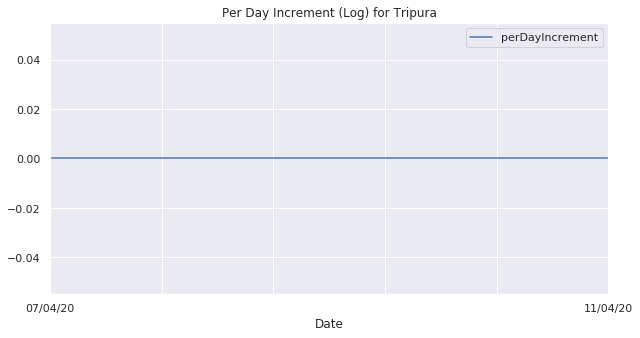

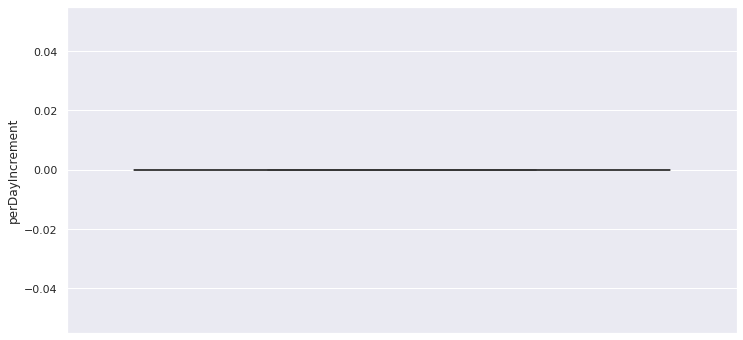

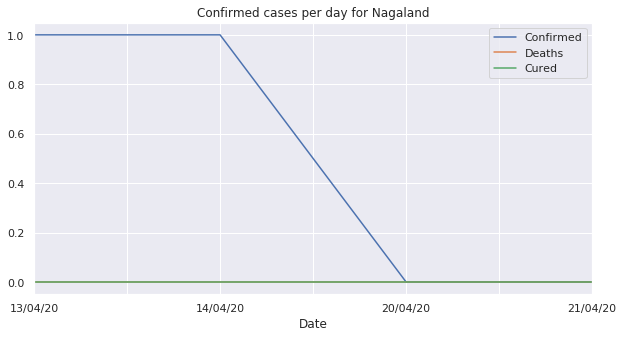

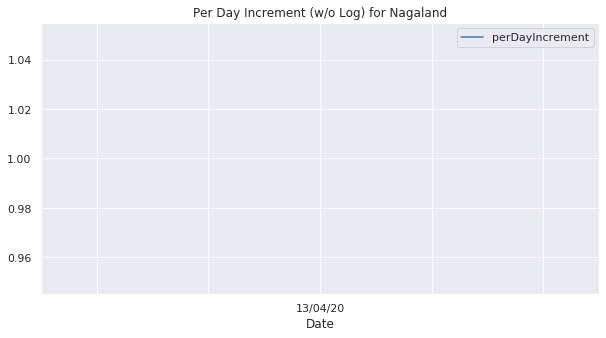

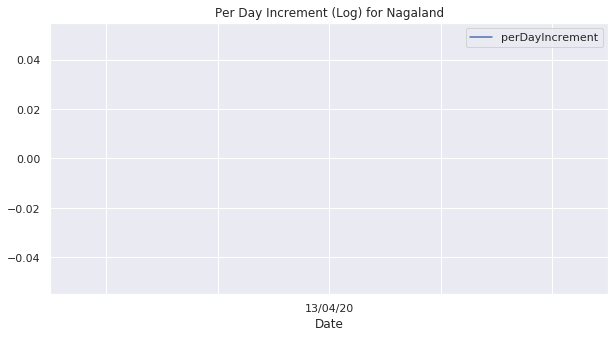

Nagaland


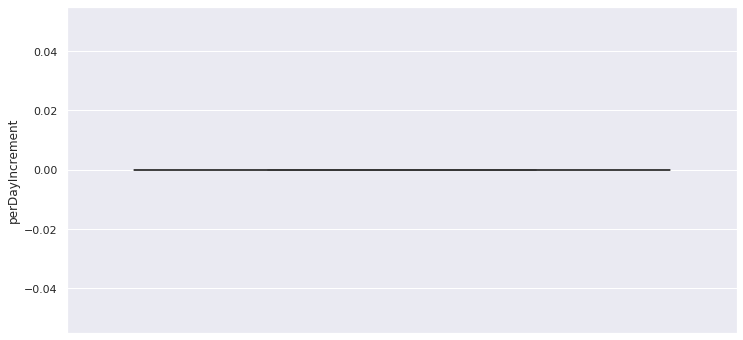

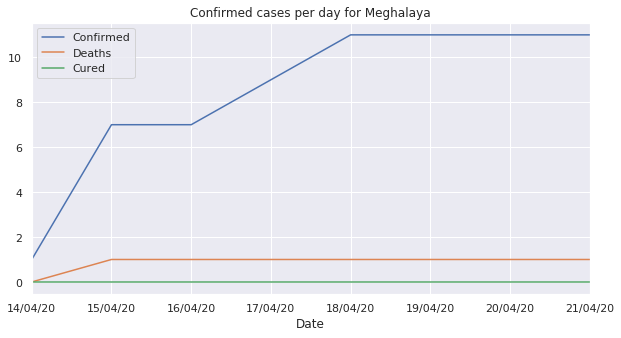

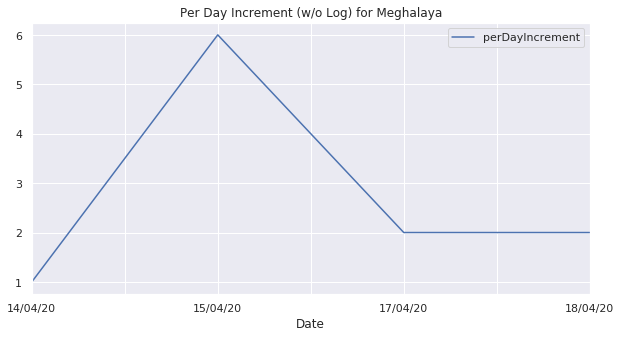

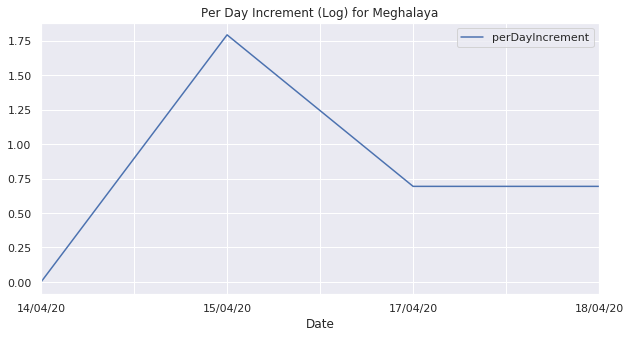

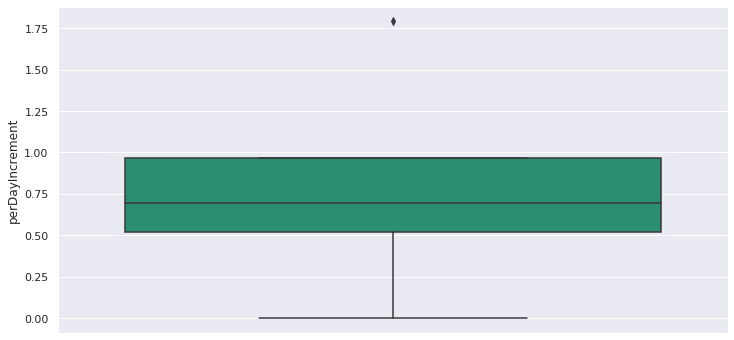

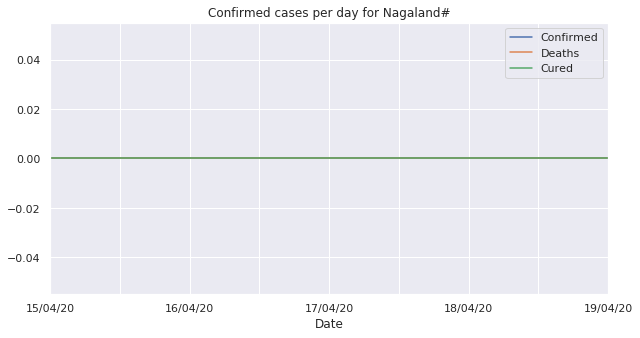

Nagaland#
|--------------------------------|----------------------|----------------------|
|             State              |         Date         |   Confirmed Cases    |
|--------------------------------|----------------------|----------------------|
|             Kerala             | 2020-04-23 00:00:00  |         417          |
|--------------------------------|----------------------|----------------------|
|           Telengana            | 2020-04-23 00:00:00  |         1011         |
|--------------------------------|----------------------|----------------------|
|             Delhi              | 2020-04-23 00:00:00  |         2354         |
|--------------------------------|----------------------|----------------------|
|           Rajasthan            | 2020-04-23 00:00:00  |         1711         |
|--------------------------------|----------------------|----------------------|
|         Uttar Pradesh          | 2020-04-23 00:00:00  |         1406         |
|-----------------

In [56]:
data = pd.read_csv('covid_19_india.csv',index_col=0)
data = data.drop(['ConfirmedIndianNational','ConfirmedForeignNational','Time'],axis = 1)
stateWise = data.groupby(['State/UnionTerritory'])[['Confirmed']].aggregate(max)
stateWise['Confirmed'].plot(kind = 'barh',figsize=(12,10))

stateList = list((pd.unique(data['State/UnionTerritory'])))
stateList.remove("Unassigned")


errorList = []
statistics = []

def printData(statList):
    print("|-{:^30}-|-{:^20}-|-{:^20}-|".format("-"*30,"-"*20,"-"*20))
    print("| {:^30} | {:^20} | {:^20} |".format("State","Date","Confirmed Cases","Score"))
    print("|-{:^30}-|-{:^20}-|-{:^20}-|".format("-"*30,"-"*20,"-"*20))
    
    for val in statList:    
        print("| {:^30} | {:^20} | {:^20} |".format(val[0],val[1],val[2]))
        print("|-{:^30}-|-{:^20}-|-{:^20}-|".format("-"*30,"-"*20,"-"*20))
        

for state in stateList:
    try:
        stateData = data[
            (data['State/UnionTerritory'] == state)
        ]

        stateData[['Date','Confirmed','Deaths','Cured']].set_index('Date').plot(kind = 'line',title = "Confirmed cases per day for "+state,figsize=(10,5))
        plt.show()
        perDayIncrement = []
        for ind,val in enumerate(stateData['Confirmed']):
            if ind == 0 or ind == len(stateData['Confirmed'] - 1):
                perDayIncrement.append(val)
            else:
                incre = (val - stateData['Confirmed'].iloc[ind-1])
                perDayIncrement.append(incre)
        else:
            stateData['perDayIncrement'] = perDayIncrement
    


        dfPerDay = stateData[['Date','Confirmed',"perDayIncrement"]]
    
        dfPerDay = dfPerDay[
            (dfPerDay['perDayIncrement'] > 0)
        ]

        dfPerDay[['Date','perDayIncrement']].set_index('Date').plot(kind = 'line',title = "Per Day Increment (w/o Log) for "+state,figsize=(10,5))
        plt.show()
        dfPerDay['perDayIncrement'] = np.log(dfPerDay['perDayIncrement'])
        dfPerDay[['Date',('perDayIncrement')]].set_index('Date').plot(kind = 'line',title = "Per Day Increment (Log) for "+state,figsize=(10,5))
        plt.show()
    
        dfPerDay['Date'] = pd.to_datetime(dfPerDay['Date'],dayfirst=True)
        dfPerDay['Date'] = dfPerDay['Date'].map(dt.datetime.toordinal)
        dfPerDay.describe()
    
        sns.boxplot(y = dfPerDay['perDayIncrement'] ,    palette="Dark2")


        x = dfPerDay['Date'].values
        x = x.reshape(-1,1)
        y = dfPerDay['perDayIncrement'].values

 
        x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.1,random_state = 10)
        rfmodel = LinearRegression(fit_intercept=True)

        rfmodel.fit(x_train,y_train)
        y_predition = rfmodel.predict(x_test)

        mse = mean_squared_error(y_test,y_predition)
        rmse = np.sqrt(mse)

        date = dt.datetime.now()
        date = pd.to_datetime(date,dayfirst=True)
        date = dt.datetime.toordinal(date)

        x = np.array([date])
        x = x.reshape(-1,1)

        confirmedPrediction = math.ceil(float(dfPerDay['Confirmed'].iloc[-1] + np.exp(rfmodel.predict(x))[0]))
        score = rfmodel.score(x_test,y_test)
        statistics.append((state,str(dt.datetime.fromordinal(date)),confirmedPrediction))
    except:
        print(state)
        continue
else:
    printData(statistics)

